# Finding optimal pulse for single-qubit hadamar using GRAPE

In [5]:
%matplotlib inline
import matplotlib.pyplot as plt
import time
import numpy as np
from numpy import pi
import datetime

In [7]:
from qutip import Qobj, identity, sigmax, sigmaz, basis, sigmay
from qutip.qip import hadamard_transform
import qutip.logging_utils as logging
logger = logging.get_logger()
#Set this to None or logging.WARN for 'quiet' execution
log_level = logging.INFO
#QuTiP control modules
import qutip.control.pulseoptim as cpo

example_name = 'Hadamard'


In [9]:
sigmax()

Quantum object: dims = [[2], [2]], shape = (2, 2), type = oper, isherm = True
Qobj data =
[[0. 1.]
 [1. 0.]]

In [11]:
# can just call the drift delta sigma z
# then control represent as complex vector with real and imaginary
# no sum of cos and sin greater than 1

In [13]:
# Drift Hamiltonian
H_d = sigmaz()/2
# The (single) control Hamiltonian
H_c =[11.328010219036514 * sigmax() + 11.328010219036514 * sigmay()]
# start p0oint for the gate evolution
U_0 = identity(2)
# Target for the gate evolution Hadamard gate
U_targ = sigmax()

In [89]:
omega_d0 = 32835711
pi_amp = 0.25578468445290536
est_freq = 4.974450442586345

In [17]:
identity(2) * 0

Quantum object: dims = [[2], [2]], shape = (2, 2), type = oper, isherm = True
Qobj data =
[[0. 0.]
 [0. 0.]]

In [19]:
basis(2,1)

Quantum object: dims = [[2], [1]], shape = (2, 1), type = ket
Qobj data =
[[0.]
 [1.]]

In [21]:
# Number of time slots
n_ts = 256
# Time allowed for the evolution
evo_time = 2560

In [23]:
# Fidelity error target
fid_err_targ = 1e-10
# Maximum iterations for the optisation algorithm
max_iter = 200
# Maximum (elapsed) time allowed in seconds
max_wall_time = 120
# Minimum gradient (sum of gradients squared)
# as this tends to 0 -> local minima has been found
min_grad = 1e-20# Fidelity error target


In [25]:
# pulse type alternatives: RND|ZERO|LIN|SINE|SQUARE|SAW|TRIANGLE|
p_type = 'RND'

In [27]:
#Set to None to suppress output files
f_ext = "{}_n_ts{}_ptype{}.txt".format(example_name, n_ts, p_type)

In [29]:
result = cpo.optimize_pulse_unitary(H_d, H_c, U_0, U_targ, n_ts, evo_time, 
                fid_err_targ=fid_err_targ, min_grad=min_grad, 
                max_iter=max_iter, max_wall_time=max_wall_time, 
                out_file_ext=f_ext, init_pulse_type=p_type, 
                log_level=log_level, gen_stats=True)

INFO:qutip.control.dynamics:Setting memory optimisations for level 0
INFO:qutip.control.dynamics:Internal operator data type choosen to be <class 'numpy.ndarray'>
INFO:qutip.control.dynamics:phased dynamics generator caching True
INFO:qutip.control.dynamics:propagator gradient caching True
INFO:qutip.control.dynamics:eigenvector adjoint caching True
INFO:qutip.control.dynamics:use sparse eigen decomp False
INFO:qutip.control.pulseoptim:System configuration:
Drift Hamiltonian:
Quantum object: dims = [[2], [2]], shape = (2, 2), type = oper, isherm = True
Qobj data =
[[ 0.5  0. ]
 [ 0.  -0.5]]
Control 1 Hamiltonian:
Quantum object: dims = [[2], [2]], shape = (2, 2), type = oper, isherm = True
Qobj data =
[[ 0.         +0.j         11.32801022-11.32801022j]
 [11.32801022+11.32801022j  0.         +0.j        ]]
Initial state / operator:
Quantum object: dims = [[2], [2]], shape = (2, 2), type = oper, isherm = True
Qobj data =
[[1. 0.]
 [0. 1.]]
Target state / operator:
Quantum object: dims =

In [31]:
result.stats.report()
print("Final evolution\n{}\n".format(result.evo_full_final))
print("********* Summary *****************")
print("Final fidelity error {}".format(result.fid_err))
print("Final gradient normal {}".format(result.grad_norm_final))
print("Terminated due to {}".format(result.termination_reason))
print("Number of iterations {}".format(result.num_iter))
print("Completed in {} HH:MM:SS.US".format(
        datetime.timedelta(seconds=result.wall_time)))


------------------------------------
---- Control optimisation stats ----
**** Timings (HH:MM:SS.US) ****
Total wall time elapsed during optimisation: 0:00:00.782770
Wall time computing Hamiltonians: 0:00:00.028661 (3.66%)
Wall time computing propagators: 0:00:00.594938 (76.00%)
Wall time computing forward propagation: 0:00:00.006143 (0.78%)
Wall time computing onward propagation: 0:00:00.005420 (0.69%)
Wall time computing gradient: 0:00:00.038132 (4.87%)

**** Iterations and function calls ****
Number of iterations: 8
Number of fidelity function calls: 17
Number of times fidelity is computed: 17
Number of gradient function calls: 16
Number of times gradients are computed: 16
Number of times timeslot evolution is recomputed: 17

**** Control amplitudes ****
Number of control amplitude updates: 16
Mean number of updates per iteration: 2.0
Number of timeslot values changed: 4096
Mean number of timeslot changes per update: 256.0
Number of amplitude values changed: 4096
Mean number of amp

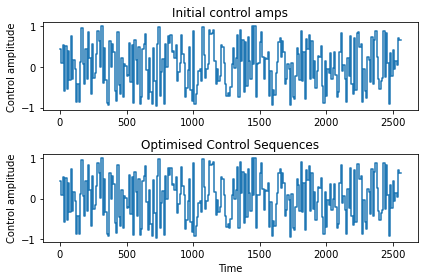

In [33]:
fig1 = plt.figure()
ax1 = fig1.add_subplot(2, 1, 1)
ax1.set_title("Initial control amps")
#ax1.set_xlabel("Time")
ax1.set_ylabel("Control amplitude")
ax1.step(result.time,
         np.hstack((result.initial_amps[:, 0], result.initial_amps[-1, 0])),
         where='post')

ax2 = fig1.add_subplot(2, 1, 2)
ax2.set_title("Optimised Control Sequences")
ax2.set_xlabel("Time")
ax2.set_ylabel("Control amplitude")
ax2.step(result.time,
         np.hstack((result.final_amps[:, 0], result.final_amps[-1, 0])),
         where='post')
plt.tight_layout()
plt.show()

In [35]:
opt_amps = result.final_amps
init_amps = result.initial_amps

In [37]:
sum(opt_amps - init_amps)

array([-0.10536543])

In [39]:
result.evo_full_final

Quantum object: dims = [[2], [2]], shape = (2, 2), type = oper, isherm = False
Qobj data =
[[-1.13475436e-06-4.09808402e-07j  6.51973842e-07-1.00000000e+00j]
 [-6.51973484e-07-1.00000000e+00j -1.13475436e-06+4.09808401e-07j]]

In [41]:
result.evo_full_initial

Quantum object: dims = [[2], [2]], shape = (2, 2), type = oper, isherm = False
Qobj data =
[[-0.74607294+0.55717553j  0.3016281 -0.20481966j]
 [-0.3016281 -0.20481966j -0.74607294-0.55717553j]]

# Feed optimized pulse into pulse simulator

In [43]:
from qiskit import IBMQ
IBMQ.load_account()
provider = IBMQ.get_provider(hub='ibm-q', group='open', project='main')
backend = provider.get_backend('ibmq_armonk')


ibmqfactory.load_account:WARNING:2020-06-29 13:58:39,083: Credentials are already in use. The existing account in the session will be replaced.


In [45]:
from qiskit.tools.jupyter import *
from qiskit import pulse
from qiskit.pulse import Play
import qiskit

In [47]:
backend_config = backend.configuration()
assert backend_config.open_pulse, "Backend doesn't support Pulse"



In [49]:

# # Assemble schedules using PulseSimulator as the backend
# pulse_qobj = assemble(schedules, backend=backend_sim)

# # Run simulation on a PulseSystemModel object
# results = backend_sim.run(pulse_qobj, system_model)


In [51]:
# a = [x[0] for x in opt_amps]

In [53]:
from qiskit.pulse import pulse_lib
# rabi_pulse = pulse_lib.gaussian(duration=1000, amp=)
# backend.configuration()

In [121]:
pi_pulse = pulse_lib.gaussian(duration=2704,
                              amp=0.2773296097765178, 
                              sigma=336,
                              name='pi_pulse')

In [74]:
import math
for i, val in enumerate(a):
    if abs(val) > 1:
        if val > 0:
            a[i]=-1
        else:
            a[i]=1

In [122]:
# opt_amps = a
opt_pulse = pulse.SamplePulse(a, name='optimized x')
## opt_pulse = pi_pulse
schedule = pulse.Schedule(name='optimized x')
#double check automaticall normalized

In [73]:
a = [b[0] for b in opt_amps]

In [76]:
len(a)

256

In [113]:
drive_chan = pulse.DriveChannel(0)
inst_sched_map = backend.defaults().instruction_schedule_map
measure = inst_sched_map.get('measure', qubits=backend_config.meas_map[0])

In [143]:
instmeasure

Schedule((0, Play(SamplePulse(array([0.00295201+0.j, 0.00597357+0.j, 0.00906536+0.j, ...,
       0.00906536+0.j, 0.00597357+0.j, 0.00295201+0.j]), name='M_m0'), MeasureChannel(0), name='M_m0')), (0, Acquire(16000, AcquireChannel(0), MemorySlot(0))), name="measure")

In [123]:
schedule += Play(pi_pulse, drive_chan)
schedule += measure << schedule.duration



/Users/benrosand/anaconda3/envs/qutip/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3331: DeprecationWarning: The parameter "scaling" is being replaced by "scale"
  exec(code_obj, self.user_global_ns, self.user_ns)


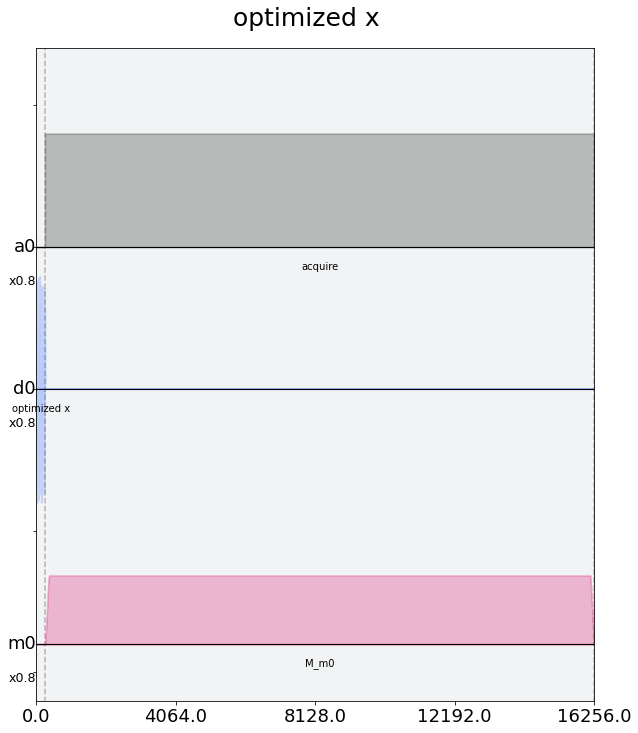

In [80]:
schedule.draw(label=True, scaling=0.8)

In [128]:
from qiskit import assemble

rough_qubit_frequency=4.97436 * (10**9)
num_shots = 1024
hadamar_prog = assemble(schedule, backend=backend, meas_level=1, meas_return='single', shots=num_shots, schedule_los=[{drive_chan: rough_qubit_frequency}])

In [134]:
x_prog = assemble(schedule, backend=backend, meas_level=1, meas_return='single', shots=num_shots)

In [133]:
backend.configuration().hamiltonian['vars']['omegad0'] = omega_d0
# backend.configuration().hamiltonian['vars']['wq0'] = 2*np.pi*est_freq

In [139]:
from qiskit.providers.aer.pulse import PulseSystemModel

system_model = PulseSystemModel.from_backend(backend)
system_model

sim_backend = qiskit.providers.aer.PulseSimulator(configuration=backend.configuration())

job = sim_backend.run(x_prog, system_model)

In [130]:
from qiskit.tools.jupyter import *
from qiskit import IBMQ
IBMQ.load_account()
provider = IBMQ.get_provider(hub='ibm-q', group='open', project='main')
backend = provider.get_backend('ibmq_armonk')

job = backend.run(x_prog)

ibmqfactory.load_account:WARNING:2020-06-29 14:12:45,051: Credentials are already in use. The existing account in the session will be replaced.
/Users/benrosand/anaconda3/envs/qutip/lib/python3.8/site-packages/ipywidgets/widgets/widget_layout.py:84: DeprecationWarning: Layout properties overflow_x and overflow_y have been deprecated and will be dropped in a future release. Please use the overflow shorthand property instead
  warnings.warn("Layout properties overflow_x and overflow_y have been deprecated and will be dropped in a future release. Please use the overflow shorthand property instead", DeprecationWarning)


In [136]:
# print(job.job_id())
job = backend.run(x_prog)

from qiskit.tools.monitor import job_monitor
job_monitor(job)

/Users/benrosand/anaconda3/envs/qutip/lib/python3.8/site-packages/ipywidgets/widgets/widget_layout.py:84: DeprecationWarning: Layout properties overflow_x and overflow_y have been deprecated and will be dropped in a future release. Please use the overflow shorthand property instead
  warnings.warn("Layout properties overflow_x and overflow_y have been deprecated and will be dropped in a future release. Please use the overflow shorthand property instead", DeprecationWarning)
Job Status: job incurred error     


In [137]:
job.error_message()

'Internal Error. Error code: 9999.'

In [423]:
[print(i.name) for i in backend.defaults().pulse_library]

M_m0
QId_d0
X90m_d0
X90p_d0
Xp_d0
Y90p_d0


[None, None, None, None, None, None]

In [138]:
# print(job.job_id())
from qiskit.tools.monitor import job_monitor
job_monitor(job)

Job Status: job incurred error


In [109]:
)

job = sim_backend.run(x_prog, system_model)))

TypeError: 'Result' object is not iterable

In [140]:
job.result(timeout=120).get_memory(0)

Exception: ZVODE exited with status: -1

In [388]:
import matplotlib.pyplot as plt

sweep_values = []
for i in range(len(frequency_sweep_results.results)):
    # Get the results from the ith experiment
    res = frequency_sweep_results.get_memory(i)*scale_factor
    # Get the results for `qubit` from this experiment
    sweep_values.append(res[qubit])

plt.scatter(frequencies_GHz, np.real(sweep_values), color='black') # plot real part of sweep values
plt.xlim([min(frequencies_GHz), max(frequencies_GHz)])
plt.xlabel("Frequency [GHz]")
plt.ylabel("Measured signal [a.u.]")
plt.show()

NameError: name 'frequency_sweep_results' is not defined

In [3]:
import qiskit

In [4]:
backend_sim = qiskit.providers.aer.PulseSimulator()

In [15]:
%%latex

\begin{align} \mathcal{H}/\hbar = & \sum_{i=0}^{0}\left(\frac{\omega_{q,i}}{2} (\mathbb{1}_i-\sigma_i^{z})+ \Omega_{d,i}D_i(t)\sigma_i^{X}\right) \end{align}

<IPython.core.display.Latex object>